In [2]:

library(Seurat)
#library(tidyverse)
library(ggplot2)
library(scales)
library(dplyr)
#library(DoubletFinder)
library(glmGamPoi)
library(openxlsx)
library(HGNChelper)
set.seed(411)
print("m")
options(future.globals.maxSize = 3 * 1024^3) 

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘glmGamPoi’


The following object is masked from ‘package:dplyr’:

    vars


The following object is masked from ‘package:ggplot2’:

    vars


Please cite our software :) 
 
 Sehyun Oh et al. HGNChelper: identification and correction of invalid gene symbols for human and mouse. F1000Research 2020, 9:1493. DOI: https://doi.org/10.12688/f1000research.28033.1 
 
 Type `citation('HGNChelper')` for a BibTeX entry.



[1] "m"


In [11]:
library("harmony")

Loading required package: Rcpp



In [2]:
paths <- c(
  "/share/hennlab/projects/NCR_scRNAseq/results/seurat/basic_seurat/batch1/TBSS04_basic_seurat.rds",
  "/share/hennlab/projects/NCR_scRNAseq/results/seurat/basic_seurat/batch2/TBSS07_basic_seurat.rds",
  "/share/hennlab/projects/NCR_scRNAseq/results/seurat/basic_seurat/batch3/TBSS12_basic_seurat.rds",
  "/share/hennlab/projects/NCR_scRNAseq/results/seurat/basic_seurat/batch4/TBSS13_basic_seurat.rds",
  "/share/hennlab/projects/NCR_scRNAseq/results/seurat/basic_seurat/batch5/TBSS18_basic_seurat.rds"
)
# Load Seurat objects
seurat_list <- lapply(paths, readRDS)
#(files are reead

In [4]:
ncol(del)

[1] 21504

In [ ]:
features <- SelectIntegrationFeatures(object.list = seurat_list)

anchors <- FindIntegrationAnchors(object.list = seurat_list, anchor.features = features)

integrated <- IntegrateData(anchorset = anchors)

In [ ]:
DefaultAssay(integrated) <- "integrated"
integrated <- ScaleData(integrated)
integrated <- RunPCA(integrated)
integrated <- RunUMAP(integrated, dims = 1:30) 

In [ ]:
str(seurat_list)

In [ ]:
str(integrated)

In [10]:
saveRDS(seurat_list, file = "/share/hennlab/projects/NCR_scRNAseq/results/seurat/seuratlist.rds")
saveRDS(integrated, file = "/share/hennlab/projects/NCR_scRNAseq/results/seurat/integrated.rds")
print("done")

[1] "done"


In [ ]:
seurat_list <- readRDS("/share/hennlab/projects/NCR_scRNAseq/results/seurat/seuratlist.rds")

In [24]:
integrated <- readRDS("/share/hennlab/projects/NCR_scRNAseq/results/seurat/integrated.rds")

In [25]:
unique(integrated@meta.data$orig.ident)

[1] "TBSS04" "TBSS07" "TBSS12" "TBSS13" "TBSS18"

In [4]:
# pipeline is to create merged object using Harmony begons here
#Merge Seurat objects
combined <- Reduce(function(x, y) merge(x, y), seurat_list)


Warning message:
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”
Warning message:
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”


In [6]:
head(combined@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,nCount_ADT,nFeature_ADT,percent.mt,percent.ribo,platelet_score,cell,donor_id,prob_max,singlet_source_vireo,RNA_snn_res.0.8,seurat_clusters,S.Score,G2M.Score,Phase,RNA.weight,ADT.weight,wsnn_res.2
,<chr>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>
AAACCTGAGACAGACC-1_1_1,TBSS04,4772,1949,1882,130,3.373847,19.425817,0,AAACCTGAGACAGACC-1,donor8,1,SNG,6,14,0.004446919,-0.04964582,S,0.4840166,0.5159834,14
AAACCTGAGACCTAGG-1_1_1,TBSS04,2590,1275,1847,135,2.972973,19.420849,0,AAACCTGAGACCTAGG-1,donor12,1,SNG,10,11,-0.009189287,-0.05345448,G1,0.7597432,0.2402568,11
AAACCTGAGACTAGGC-1_1_1,TBSS04,5318,1934,1941,132,3.140278,28.977059,0,AAACCTGAGACTAGGC-1,donor14,1,SNG,0,4,-0.047649372,0.01922976,G2M,0.7884518,0.2115482,4
AAACCTGAGAGGTTAT-1_1_1,TBSS04,2235,1484,1346,131,4.921700,1.923937,0,AAACCTGAGAGGTTAT-1,donor20,1,SNG,14,25,0.083719208,0.18827396,G2M,0.6576602,0.3423398,25
AAACCTGAGATAGCAT-1_1_1,TBSS04,2550,946,1179,131,3.411765,40.313725,0,AAACCTGAGATAGCAT-1,donor6,1,SNG,5,6,0.013071155,-0.07410911,S,0.7197458,0.2802542,6
AAACCTGAGCCACGCT-1_1_1,TBSS04,3491,1157,2007,134,3.437410,45.660269,0,AAACCTGAGCCACGCT-1,donor25,1,SNG,5,8,-0.008708239,-0.03288194,G1,0.5565209,0.4434791,8


In [ ]:
str(combined)
combined@reductions$pca

[1] 112920

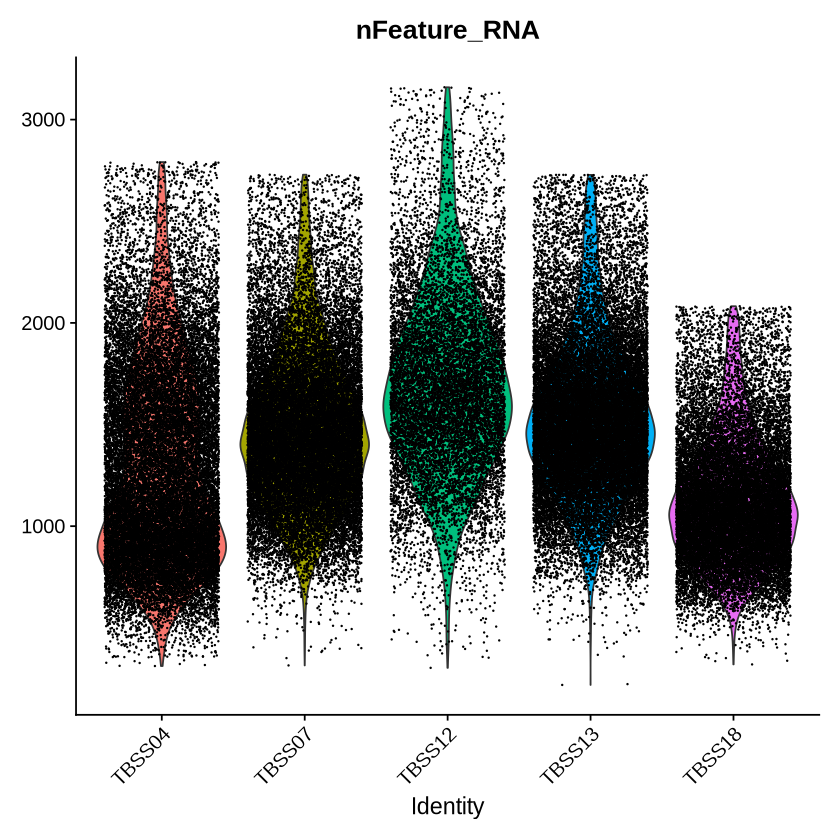

In [8]:
ncol(combined)
VlnPlot(combined, features = c("nFeature_RNA"), group.by = "orig.ident") + guides(fill = "none") 

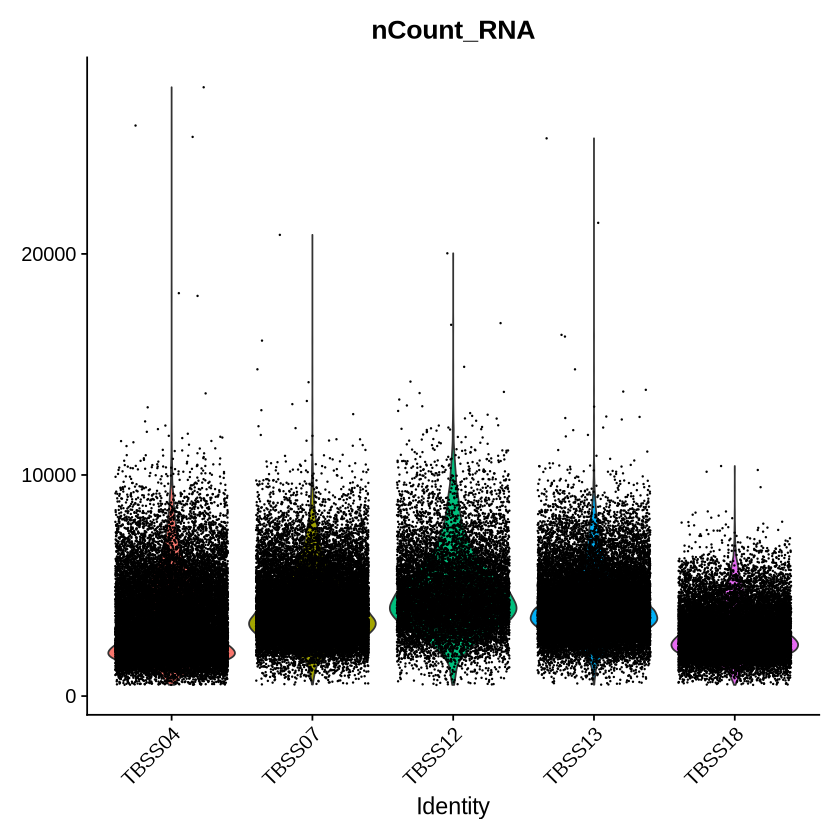

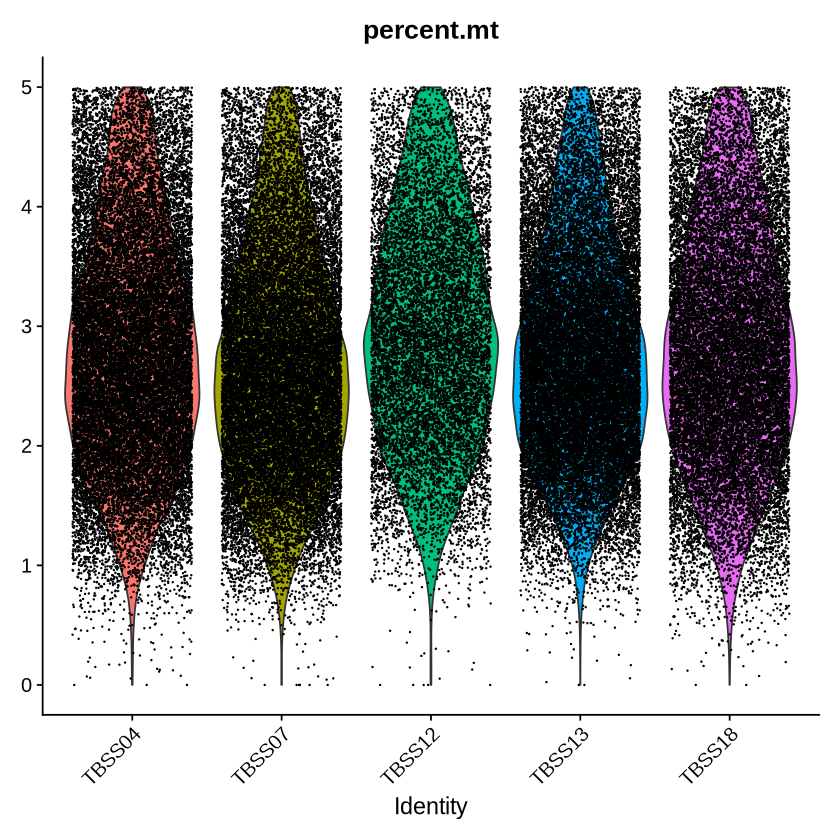

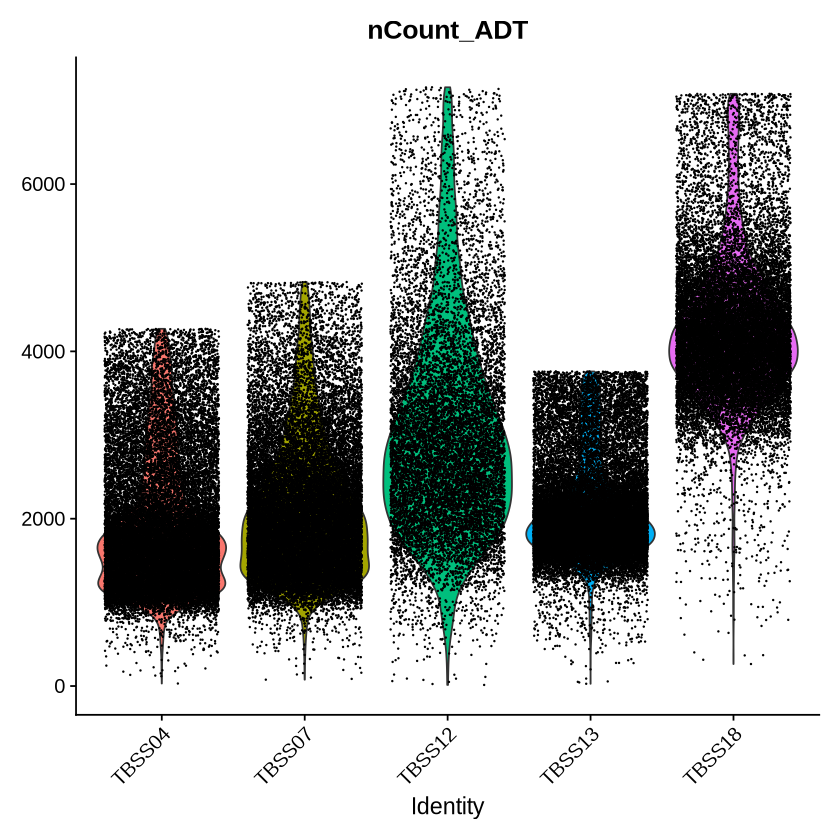

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



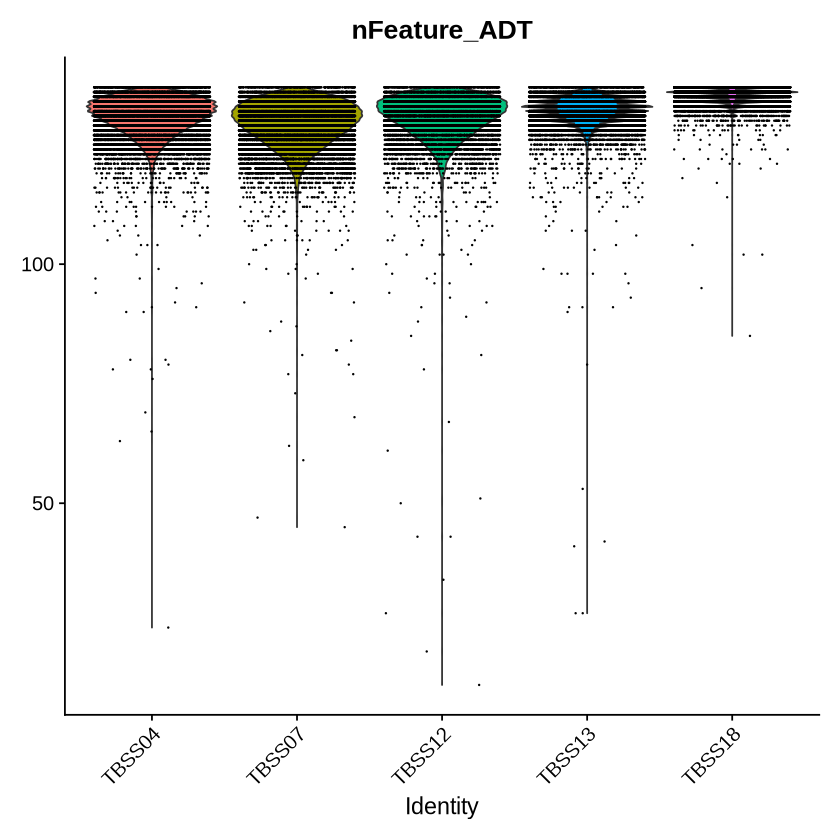

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



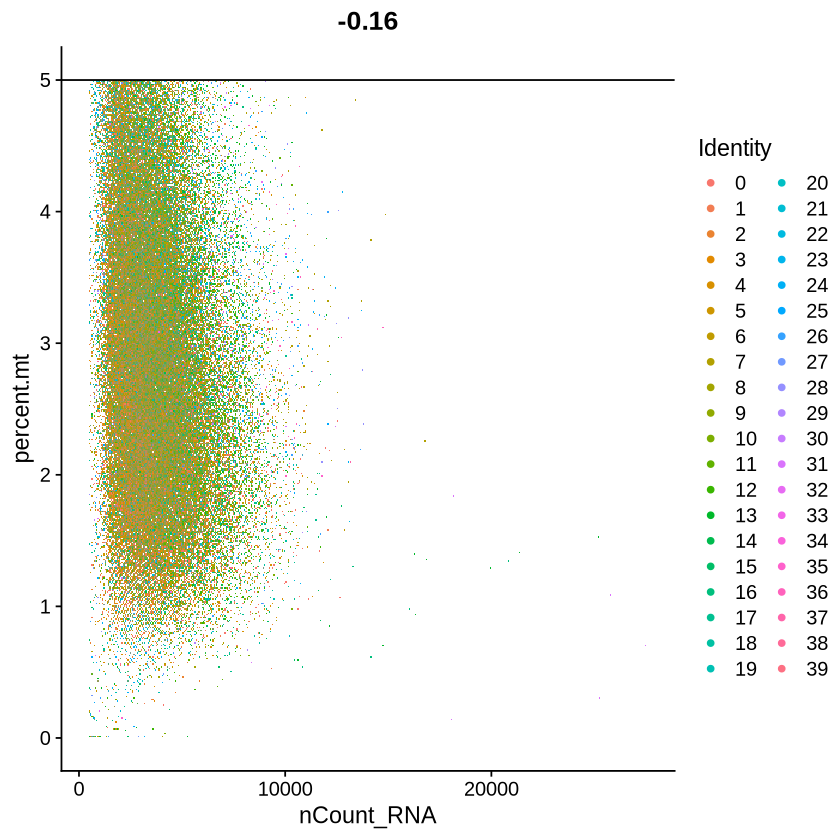

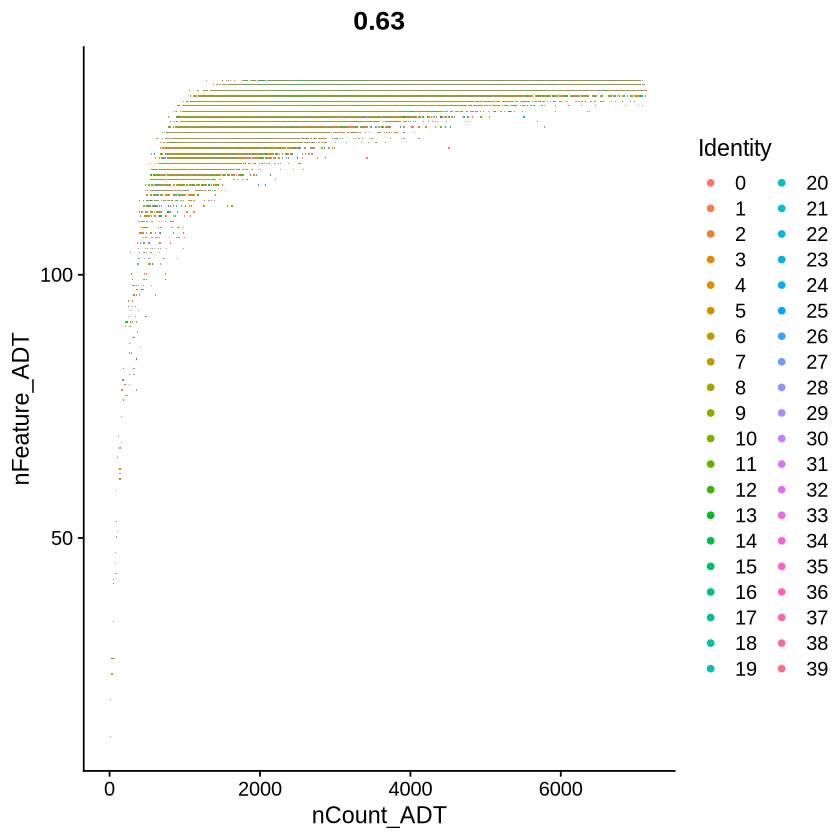

Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of platelet_score.”


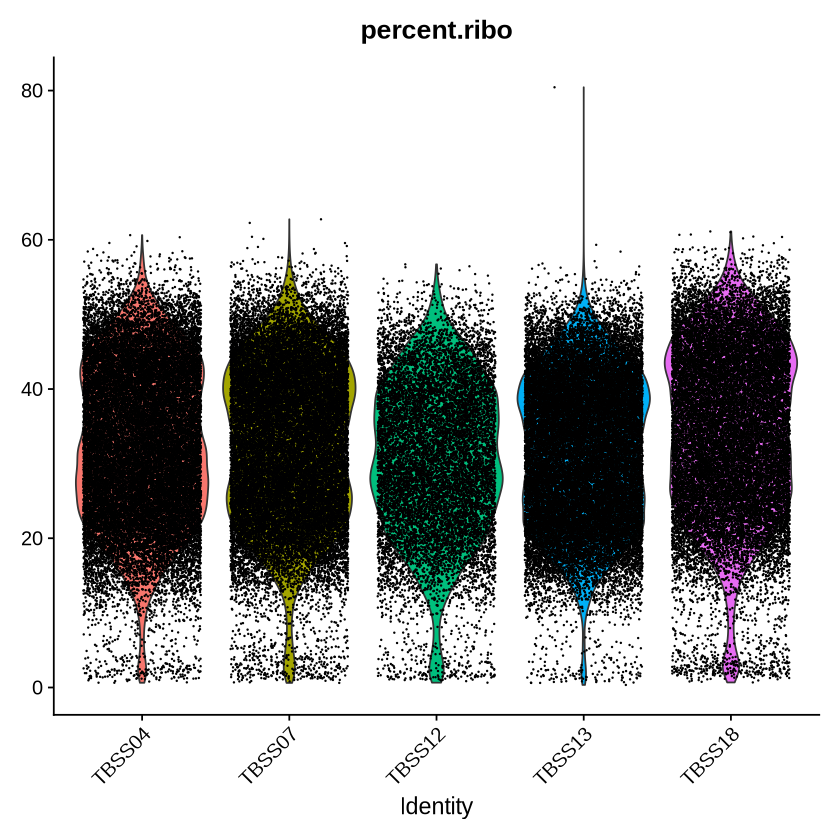

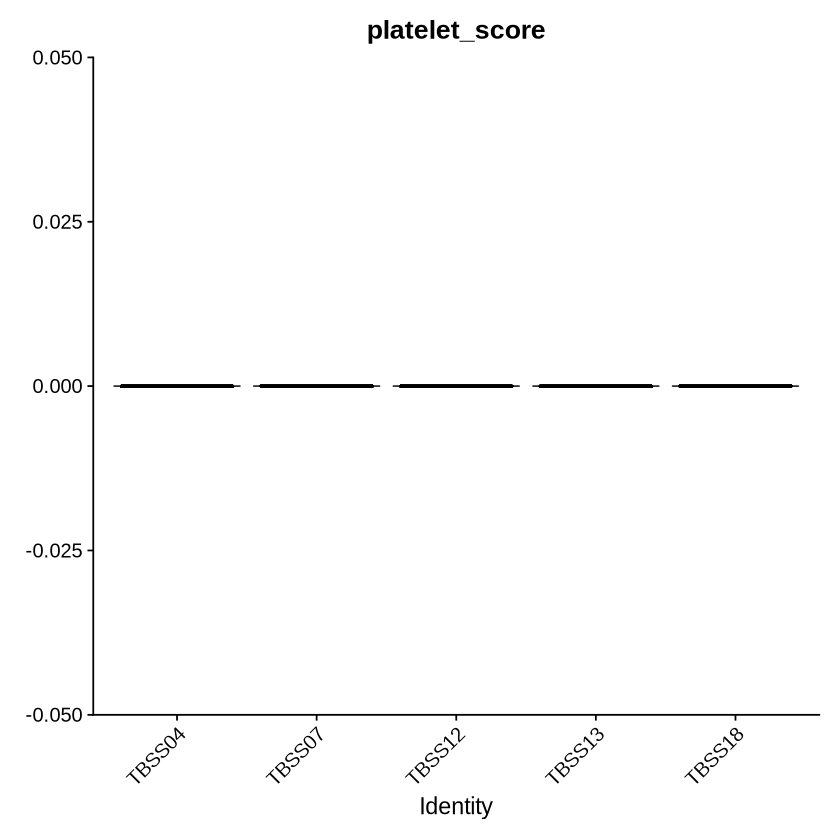

In [10]:
 
# basc qc
#violin plot
VlnPlot(combined, features = c("nCount_RNA"), group.by = "orig.ident") + guides(fill = "none")  

#violin plot
VlnPlot(combined, features = c("percent.mt"), group.by = "orig.ident") + guides(fill = "none")

VlnPlot(combined, features = c("nCount_ADT"), group.by = "orig.ident") + guides(fill = "none")  

VlnPlot(combined, features = c("nFeature_ADT"), group.by = "orig.ident") + guides(fill = "none")  

FeatureScatter(combined, feature1 = "nCount_RNA", feature2 = "percent.mt")  
 

FeatureScatter(combined, feature1 = "nCount_ADT", feature2 = "nFeature_ADT") 
 

VlnPlot(combined, features = c("percent.ribo"), group.by = "orig.ident") + guides(fill = "none") 
 

In [ ]:
# Process RNA data with standard workflow
combined <- NormalizeData(combined, assay = "RNA", normalization.method = "LogNormalize") %>%
  FindVariableFeatures(assay = "RNA", selection.method = "vst", nfeatures = 2000) %>%    # Specify RNA assay for variable feature selection
  ScaleData(assay = "RNA") %>%               # Specify RNA assay for scaling
  RunPCA(assay = "RNA",reduction.name = "pca", reduction.key = "PCA_") %>% # Specify RNA assay for PCA
  FindNeighbors(assay = "RNA", dims = 1:50)  %>%
  FindClusters(assay = "RNA",  resolution = 1.2)  %>%
  RunUMAP(reduction = 'pca', dims = 1:50, assay = 'RNA', 
              reduction.name = 'rna.umap', reduction.key = 'rnaUMAP_')
print("processed combined RNA data")

In [ ]:
# Process ADT data
combined <- NormalizeData(combined, assay = "ADT", normalization.method = "CLR",margin = 2) %>%
  ScaleData(assay = "ADT")

# Run PCA on all ADT features
adt_features <- rownames(combined[["ADT"]])  # Get all ADT features
combined <- RunPCA(combined, assay = "ADT", features = adt_features, reduction.name = "apca", reduction.key = "APCA_") %>%
  FindNeighbors(assay = "ADT", dims = 1:50) %>%
  FindClusters(assay = "ADT", resolution = 1.2) %>%
  RunUMAP(reduction = 'apca', dims = 1:50, assay = 'ADT', 
          reduction.name = 'adt.umap', reduction.key = 'adtUMAP_')

In [1]:
print(DimPlot(merged_obj, reduction = "umap", group.by = "batch"))  
 
 

ERROR: Error in DimPlot(merged_obj, reduction = "umap", group.by = "batch"): could not find function "DimPlot"


In [ ]:
combined <- FindMultiModalNeighbors(combined, reduction.list = list("pca", "apca"), dims.list = list(1:50, 1:50),modality.weight.name = c("RNA.weight", "ADT.weight"))

 
 

combined <- RunUMAP(combined, nn.name = "weighted.nn", reduction.name = "wnn.umap", reduction.key = "wnnUMAP_")
combined <- FindClusters(combined, graph.name = "wsnn", algorithm = 3, resolution = 2, verbose = FALSE)
DimPlot(combined, reduction = 'wnn.umap', label = TRUE, repel = TRUE, label.size = 4.5) 


In [17]:

saveRDS(combined, file = "/share/hennlab/projects/NCR_scRNAseq/results/seurat/combined_nointegration.rds")

In [7]:
harmonised <- NormalizeData(combined)
harmonised <- FindVariableFeatures(harmonised)
harmonised <- ScaleData(harmonised)


Normalizing layer: counts.TBSS04.SeuratProject.SeuratProject.SeuratProject

Normalizing layer: counts.TBSS07.SeuratProject.SeuratProject.SeuratProject

Normalizing layer: counts.TBSS12.SeuratProject.SeuratProject

Normalizing layer: counts.TBSS13.SeuratProject

Normalizing layer: counts.TBSS18

Finding variable features for layer counts.TBSS04.SeuratProject.SeuratProject.SeuratProject

Finding variable features for layer counts.TBSS07.SeuratProject.SeuratProject.SeuratProject

Finding variable features for layer counts.TBSS12.SeuratProject.SeuratProject

Finding variable features for layer counts.TBSS13.SeuratProject

Finding variable features for layer counts.TBSS18

Centering and scaling data matrix



In [ ]:
harmonised  <- RunPCA(harmonised, assay = "RNA")
DimPlot(harmonised, reduction = "pca", group.by = "orig.ident")
VlnPlot(harmonised, features = c("nFeature_RNA"), group.by = "orig.ident") + guides(fill = "none") 

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



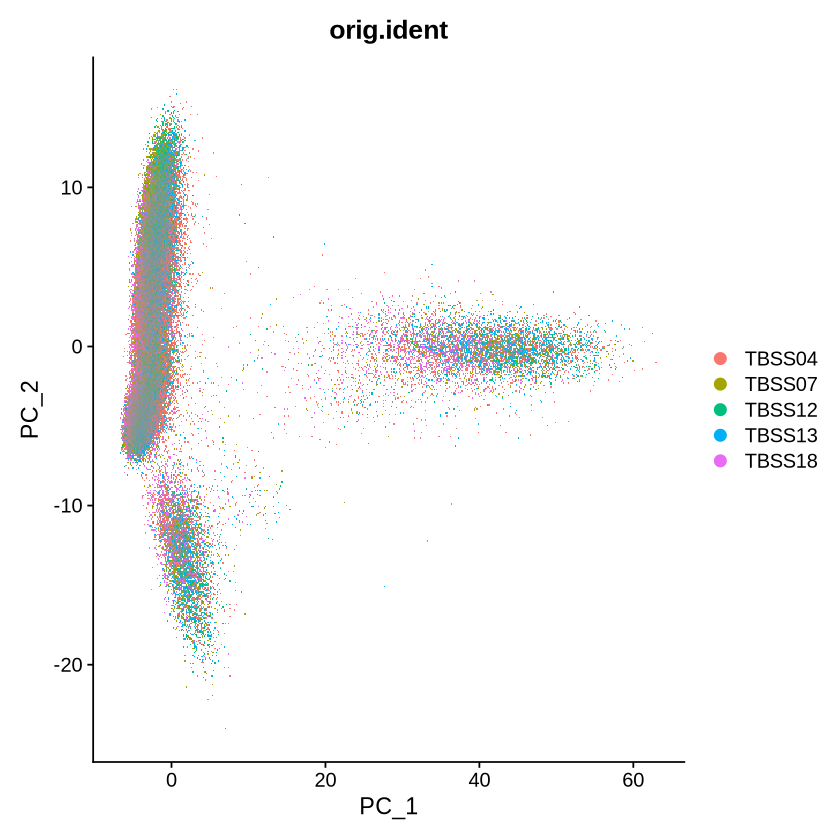

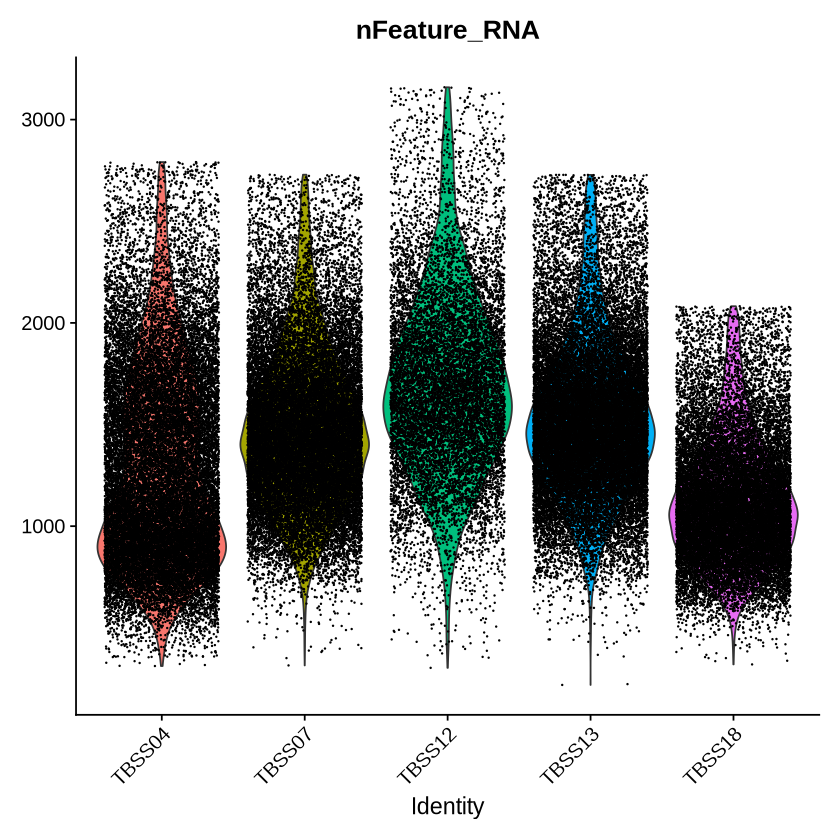

In [ ]:
 # Run Harmony
merged_obj <- RunHarmony(
  object = merged_obj,
  group.by.vars = "batch",      # Specify the metadata column with batch information
  assay.use = "RNA",            # Assay to use for Harmony
  reduction = "pca",            # Reduction method to harmonize
  project.dim = FALSE           # Don't re-project dimensions
)

# Use Harmony embeddings for downstream analysis
merged_obj <- RunUMAP(merged_obj, reduction = "harmony", dims = 1:30)
merged_obj <- FindNeighbors(merged_obj, reduction = "harmony", dims = 1:30)
merged_obj <- FindClusters(merged_obj, resolution = 0.5)

# Visualization
DimPlot(merged_obj, reduction = "umap", group.by = "batch")
DimPlot(merged_obj, reduction = "umap", group.by = "seurat_clusters")

Transposing data matrix

Initializing state using k-means centroids initialization

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 5646000)”
Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony converged after 3 iterations



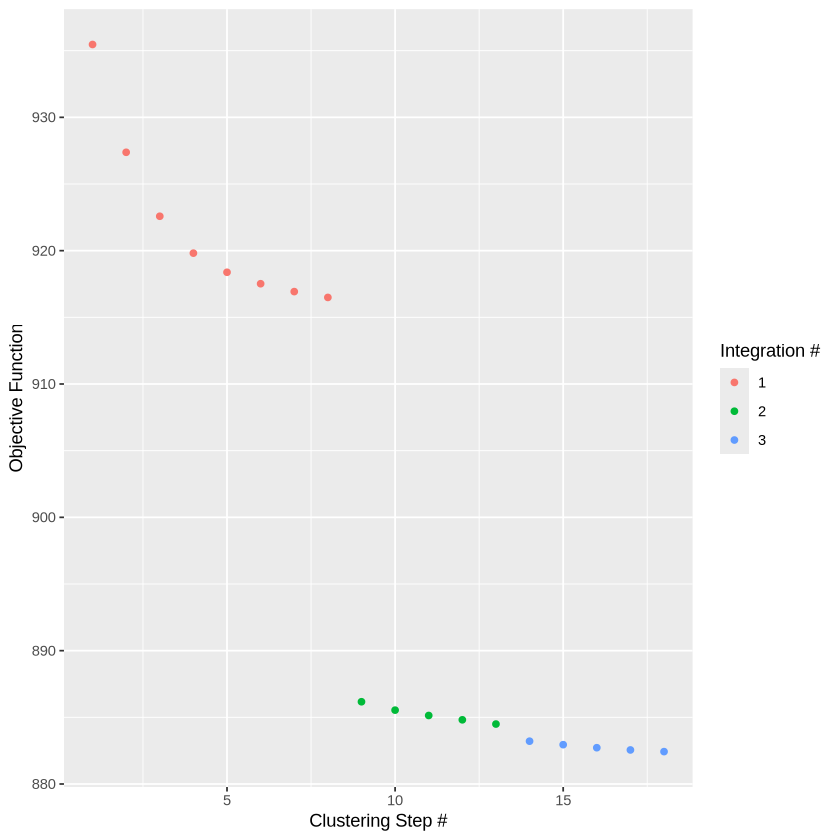

In [12]:
harmonised<- RunHarmony(harmonised, "orig.ident", plot_convergence = TRUE)
str(harmonised)
harmonised <- RunUMAP(harmonised, reduction = "harmony",dims = 1:30) 

In [17]:
saveRDS(harmonised, file = "/share/hennlab/projects/NCR_scRNAseq/results/seurat/HARMONISED2025.rds")

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



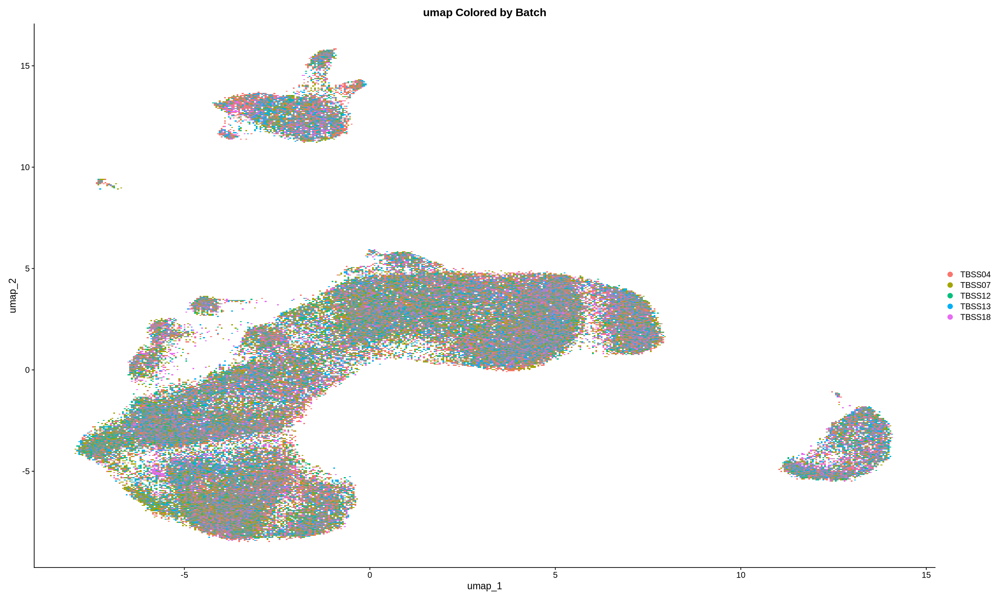

In [18]:
options(repr.plot.width = 20, repr.plot.height = 12)
DimPlot(harmonised, reduction = "umap", group.by = "orig.ident", dims = c(1, 2)) +
  ggtitle("umap Colored by Batch")

In [16]:
options(repr.plot.width = 20, repr.plot.height = 12)
DimPlot(integrated, reduction = "umap", group.by = "orig.ident", dims = c(1, 2)) +
  ggtitle("umap Colored by Batch")

ERROR: Error: object 'integrated' not found


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



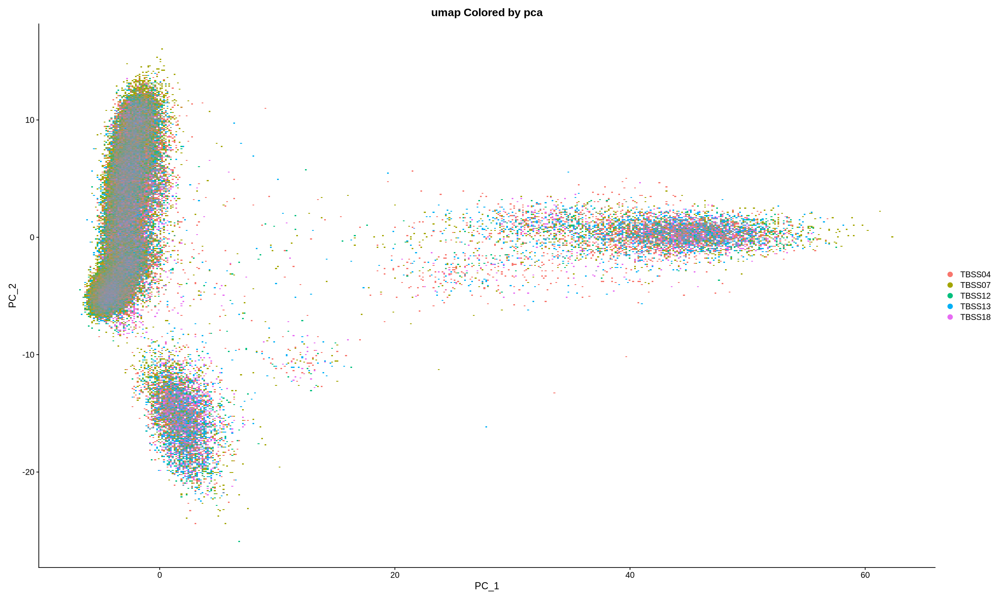

In [9]:
options(repr.plot.width = 20, repr.plot.height = 12)
DimPlot(integrated, reduction = "pca", group.by = "orig.ident") +
  ggtitle("umap Colored by pca")

In [13]:
options(repr.plot.width = 20, repr.plot.height = 12)
table(integrated@meta.data$orig.ident)



TBSS04 TBSS07 TBSS12 TBSS13 TBSS18 
 26008  25675  12283  27450  21504 

Warning message:
“Could not find TRGC2 in the default search locations, found in ‘RNA’ assay instead”
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



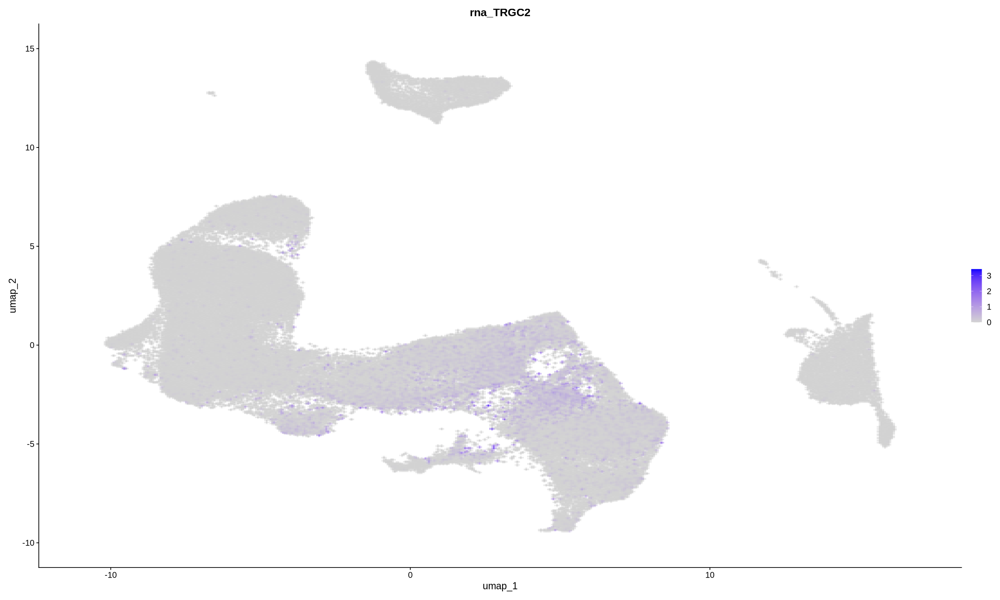

In [19]:
FeaturePlot(
  integrated, 
  features = "TRGC2", 
  reduction = "umap", 
  pt.size = 1.5
) 

In [19]:
# start cell type annotation
source("https://raw.githubusercontent.com/IanevskiAleksandr/sc-type/master/R/gene_sets_prepare.R")
# load cell type annotation function
source("https://raw.githubusercontent.com/IanevskiAleksandr/sc-type/master/R/sctype_score_.R")
gs.list <- gene_sets_prepare("https://raw.githubusercontent.com/IanevskiAleksandr/sc-type/master/ScTypeDB_short.xlsx", "Immune system") # e.g. Imm
es.max <- sctype_score(GetAssayData(integrated, assay = "integrated", layer = "scale"),
                       scaled = TRUE,
                       gs = gs.list$gs_positive,
                       gs2 = gs.list$gs_negative)

In [26]:

# harmonised, used to be integrated,

In [27]:
# merge by cluster
cL_resutls <- do.call("rbind", lapply(unique(integrated@meta.data$seurat_clusters), function(cl){
    es.max.cl = sort(rowSums(es.max[ ,rownames(integrated@meta.data[integrated@meta.data$seurat_clusters==cl, ])]), decreasing = !0)
    head(data.frame(cluster = cl, type = names(es.max.cl), scores = es.max.cl, ncells = sum(integrated@meta.data$seurat_clusters==cl)), 10)
}))
sctype_scores <- cL_resutls %>% group_by(cluster) %>% top_n(n = 1, wt = scores)  

In [28]:
#just a visual to see whats happeneng above, were taking the cell type wiuht top score for each cluster
head(cL_resutls)
head(sctype_scores)

,cluster,type,scores,ncells
,<chr>,<chr>,<dbl>,<int>
ISG expressing immune cells,14,ISG expressing immune cells,7803.311,3291
CD8+ NKT-like cells,14,CD8+ NKT-like cells,4765.210,3291
CD4+ NKT-like cells,14,CD4+ NKT-like cells,4202.449,3291
Natural killer cells,14,Natural killer cells,3582.001,3291
Effector CD8+ T cells,14,Effector CD8+ T cells,2209.089,3291
γδ-T cells,14,γδ-T cells,1663.346,3291


cluster,type,scores,ncells
<chr>,<chr>,<dbl>,<int>
14,ISG expressing immune cells,7803.311,3291
11,ISG expressing immune cells,2057.381,4303
4,Effector CD8+ T cells,1644.231,6853
25,Non-classical monocytes,3022.881,991
6,Naive CD4+ T cells,2621.679,6184
8,Naive CD4+ T cells,3234.127,5246


In [29]:
sctype_scores <- sctype_scores %>%
  mutate(type = if_else(as.numeric(as.character(scores)) < ncells / 4, "Unknown", type))
print(sctype_scores[,1:3])


# A tibble: 40 × 3
# Groups:   cluster [40]
   cluster type                        scores
   <chr>   <chr>                        <dbl>
 1 14      ISG expressing immune cells  7803.
 2 11      ISG expressing immune cells  2057.
 3 4       Unknown                      1644.
 4 25      Non-classical monocytes      3023.
 5 6       Naive CD4+ T cells           2622.
 6 8       Naive CD4+ T cells           3234.
 7 10      Classical Monocytes          7374.
 8 1       Naive CD4+ T cells           4637.
 9 23      CD8+ NKT-like cells          2534.
10 20      Naive B cells                1930.
# ℹ 30 more rows


In [30]:
integrated@meta.data$sctype_classification = ""
for(j in unique(sctype_scores$cluster)){
  cl_type = sctype_scores[sctype_scores$cluster==j,]; 
  integrated@meta.data$sctype_classification[integrated@meta.data$seurat_clusters == j] = as.character(cl_type$type[1])
}

In [ ]:
DimPlot(integrated, reduction = "umap", label = TRUE, repel = TRUE, group.by = 'sctype_classification', label.size = 5) +theme(legend.title = element_text(size = 16),legend.text = element_text(size = 16))     # Adjust legend label siz

In [35]:
ncol(integrated)
ncol(harmonised)

[1] 112920

[1] 112920

In [32]:
markers <-read.csv("/share/hennlab/projects/NCR_scRNAseq/data/Markers.csv", na.strings = c("", "NA"))
#head(markers)
#markers[[marker == "CD19"]]$ADT_name
tcell_rna_markers <- na.omit(markers[markers$Cell.type == "T-cells", "RNA_name"])
bcell_rna_markers <- na.omit(markers[markers$Cell.type == "B-cell", "RNA_name"])
monocytes_rna_markers <- na.omit(markers[markers$Cell.type == "Monocytes", "RNA_name"])
nkcell_rna_markers <- na.omit(markers[markers$Cell.type == "NK-cells", "RNA_name"])
dendritic_cell_rna_markers <- na.omit(markers[markers$Cell.type == "Dendritic-Cell", "RNA_name"])


 

my_colors <- c(
  "#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd",
  "#8c564b", "#e377c2", "#7f7f7f", "#bcbd22", "#17becf",
  "#393b79", "#637939", "#8c6d31", "#843c39", "#7b4173",
  "#5254a3", "#9c9ede", "#d6616b", "#b00b69", "#de9ed6"
)
adt_markers <- na.omit(markers$ADT_name)
 
 


Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'γδ-T cells' in 'mbcsToSbcs': dot substituted for <ce>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'γδ-T cells' in 'mbcsToSbcs': dot substituted for <b3>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'γδ-T cells' in 'mbcsToSbcs': dot substituted for <ce>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'γδ-T cells' in 'mbcsToSbcs': dot substituted for <b4>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'γδ-T cells' in 'mbcsToSbcs': dot substituted for <ce>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'γδ-T cells' in 'mbcsToSbcs': dot substituted for <b3>”
Warning message in grid.Call

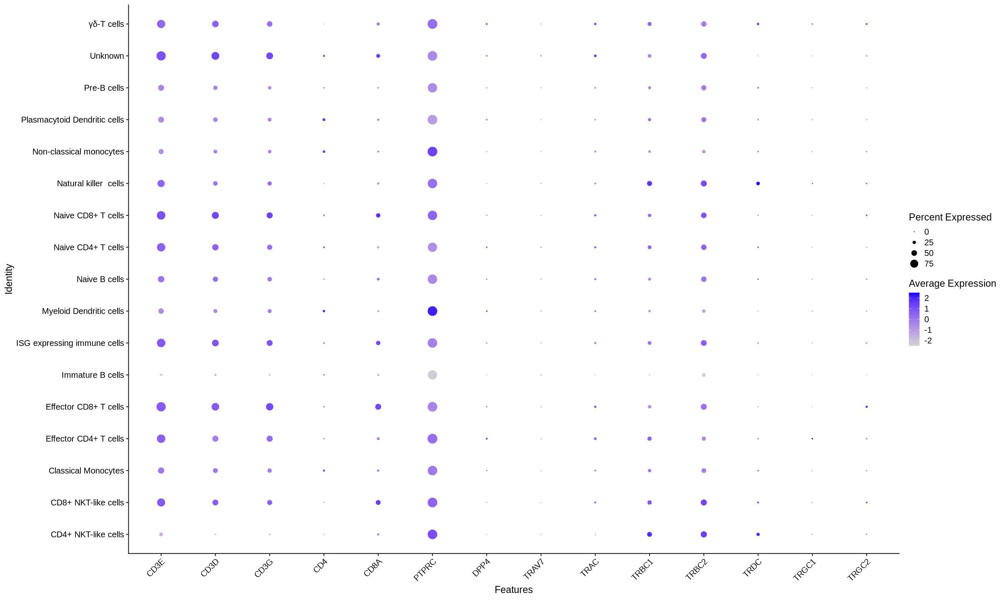

In [33]:
DotPlot(integrated, features = tcell_rna_markers, group.by = "sctype_classification", assay = "RNA") + RotatedAxis()  

In [ ]:
DotPlot(integrated, features = nkcell_rna_markers, group.by = "sctype_classification",  , assay = "RNA") + RotatedAxis()  

In [ ]:
DotPlot(integrated, features = bcell_rna_markers, group.by = "sctype_classification"  , assay = "RNA") + RotatedAxis()  

In [ ]:
DotPlot(integrated, features = dendritic_cell_rna_markers, group.by = "sctype_classification"  , assay = "RNA") + RotatedAxis()  

In [ ]:
DotPlot(integrated, features = monocytes_rna_markers, group.by = "sctype_classification"  , scale = FALSE, assay = "RNA") + RotatedAxis()  

In [ ]:
DotPlot(integrated, features = adt_markers, group.by = "sctype_classification"  , assay = "ADT") + RotatedAxis()  

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



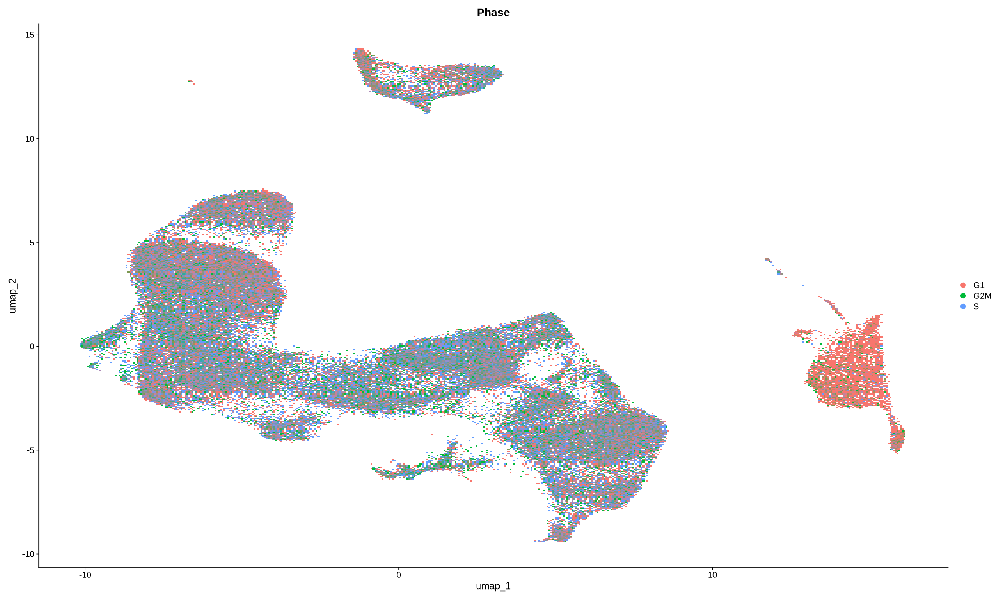

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



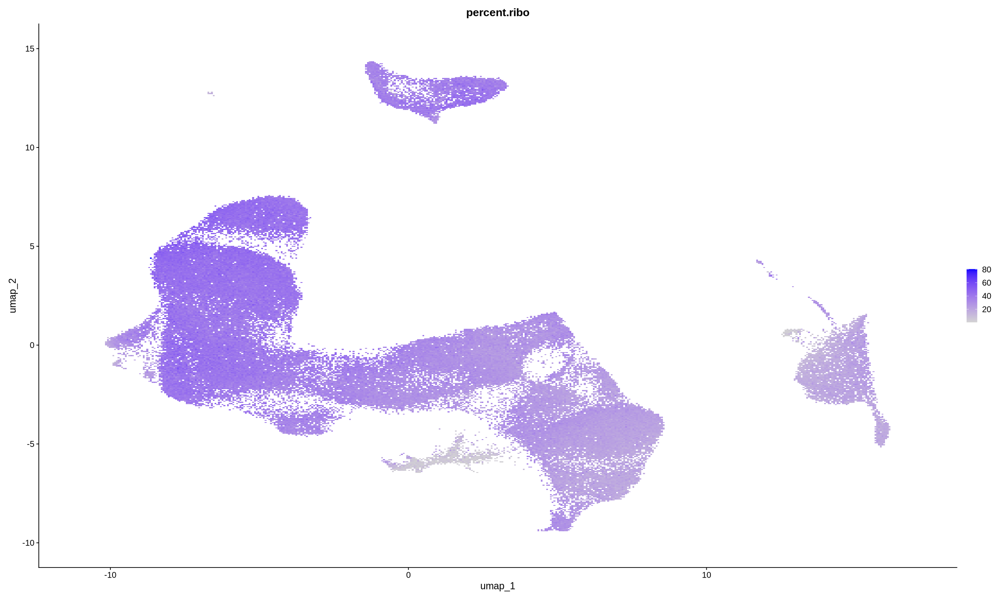

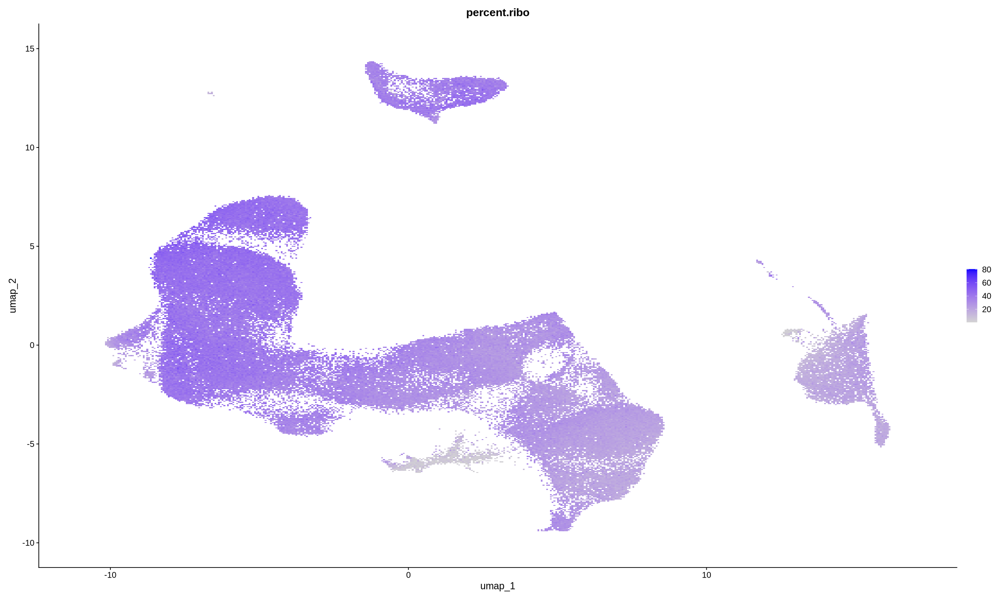

In [38]:
print(DimPlot(integrated, group.by = "Phase", reduction = "umap"))
print(FeaturePlot(integrated, features = "percent.ribo", reduction = "umap"))
 

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



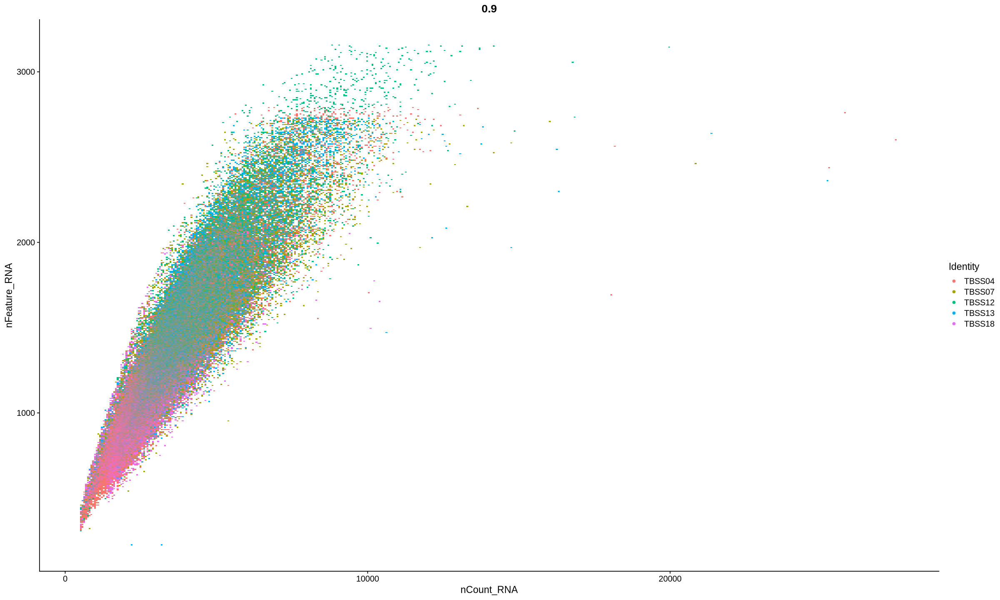

In [48]:
# Feature scatter plot of nCount_RNA vs. nFeature_RNA
DefaultAssay(integrated) <- "RNA"
print(VlnPlot(seurat_obj, features = c("nFeature_RNA"), group.by = "donor_id") + guides(fill = "none") 
FeatureScatter(
  object = integrated,
  feature1 = "nCount_RNA",
  feature2 = "nFeature_RNA",
  group.by = "orig.ident"
) 

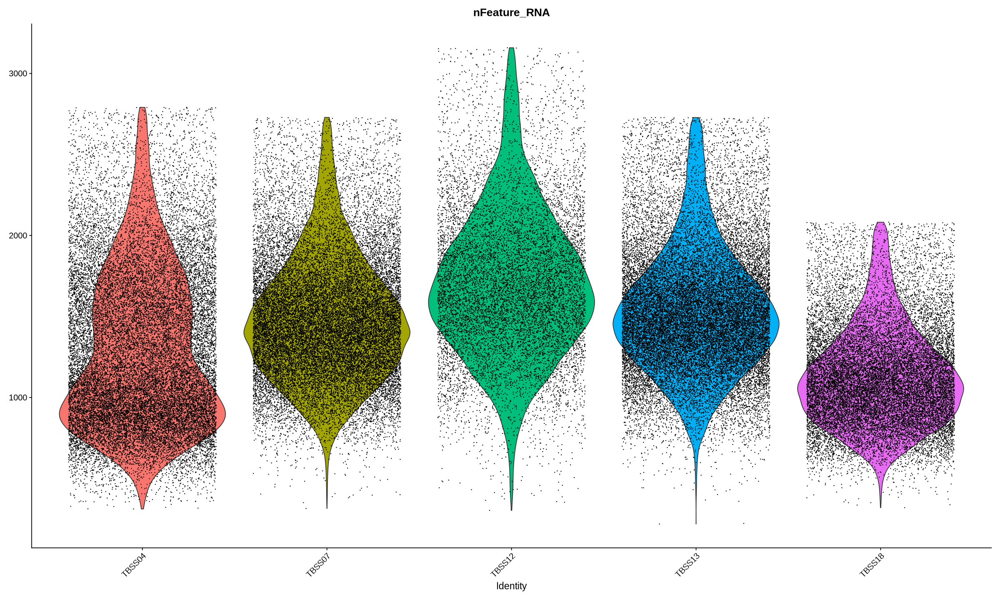

In [51]:
VlnPlot(integrated, features = c("nFeature_RNA"), group.by = "orig.ident") + guides(fill = "none") 

In [ ]:
# pipeline for harmony data
#GetAssayData(harmonised, assay = "RNA", layer = "scale")
str(harmonised)


In [45]:
es.max <- sctype_score(GetAssayData(harmonised, assay = "RNA", layer = "scale"),
                       scaled = TRUE,
                       gs = gs.list$gs_positive,
                       gs2 = gs.list$gs_negative)

# merge by cluster
cL_resutls <- do.call("rbind", lapply(unique(harmonised@meta.data$seurat_clusters), function(cl){
    es.max.cl = sort(rowSums(es.max[ ,rownames(harmonised@meta.data[harmonised@meta.data$seurat_clusters==cl, ])]), decreasing = !0)
    head(data.frame(cluster = cl, type = names(es.max.cl), scores = es.max.cl, ncells = sum(harmonised@meta.data$seurat_clusters==cl)), 10)
}))
sctype_scores <- cL_resutls %>% group_by(cluster) %>% top_n(n = 1, wt = scores)  

#just a visual to see whats happeneng above, were taking the cell type wiuht top score for each cluster
head(cL_resutls)
head(sctype_scores)

sctype_scores <- sctype_scores %>%
  mutate(type = if_else(as.numeric(as.character(scores)) < ncells / 4, "Unknown", type))
print(sctype_scores[,1:3])

harmonised@meta.data$sctype_classification = ""
for(j in unique(sctype_scores$cluster)){
  cl_type = sctype_scores[sctype_scores$cluster==j,]; 
  harmonised@meta.data$sctype_classification[harmonised@meta.data$seurat_clusters == j] = as.character(cl_type$type[1])
}

ERROR: [1m[33mError[39m in `GetAssayData()`:[22m
[33m![39m GetAssayData doesn't work for multiple layers in v5 assay.


Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘glmGamPoi’


The following object is masked from ‘package:dplyr’:

    vars


The following object is masked from ‘package:ggplot2’:

    vars


Please cite our software :) 
 
 Sehyun Oh et al. HGNChelper: identification and correction of invalid gene symbols for human and mouse. F1000Research 2020, 9:1493. DOI: https://doi.org/10.12688/f1000research.28033.1 
 
 Type `citation('HGNChelper')` for a BibTeX entry.



[1] "m"


Loading required package: Rcpp

Warning message:
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”
Warning message:
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”


,orig.ident,nCount_RNA,nFeature_RNA,nCount_ADT,nFeature_ADT,percent.mt,percent.ribo,platelet_score,cell,donor_id,prob_max,singlet_source_vireo
,<chr>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>
AAACCTGAGACAGACC-1_1_1,TBSS04,4772,1949,1882,130,3.373847,19.425817,0,AAACCTGAGACAGACC-1,donor8,1,SNG
AAACCTGAGACCTAGG-1_1_1,TBSS04,2590,1275,1847,135,2.972973,19.420849,0,AAACCTGAGACCTAGG-1,donor12,1,SNG
AAACCTGAGACTAGGC-1_1_1,TBSS04,5318,1934,1941,132,3.140278,28.977059,0,AAACCTGAGACTAGGC-1,donor14,1,SNG
AAACCTGAGAGGTTAT-1_1_1,TBSS04,2235,1484,1346,131,4.921700,1.923937,0,AAACCTGAGAGGTTAT-1,donor20,1,SNG
AAACCTGAGATAGCAT-1_1_1,TBSS04,2550,946,1179,131,3.411765,40.313725,0,AAACCTGAGATAGCAT-1,donor6,1,SNG
AAACCTGAGCCACGCT-1_1_1,TBSS04,3491,1157,2007,134,3.437410,45.660269,0,AAACCTGAGCCACGCT-1,donor25,1,SNG


[1] 146404

Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”
Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”


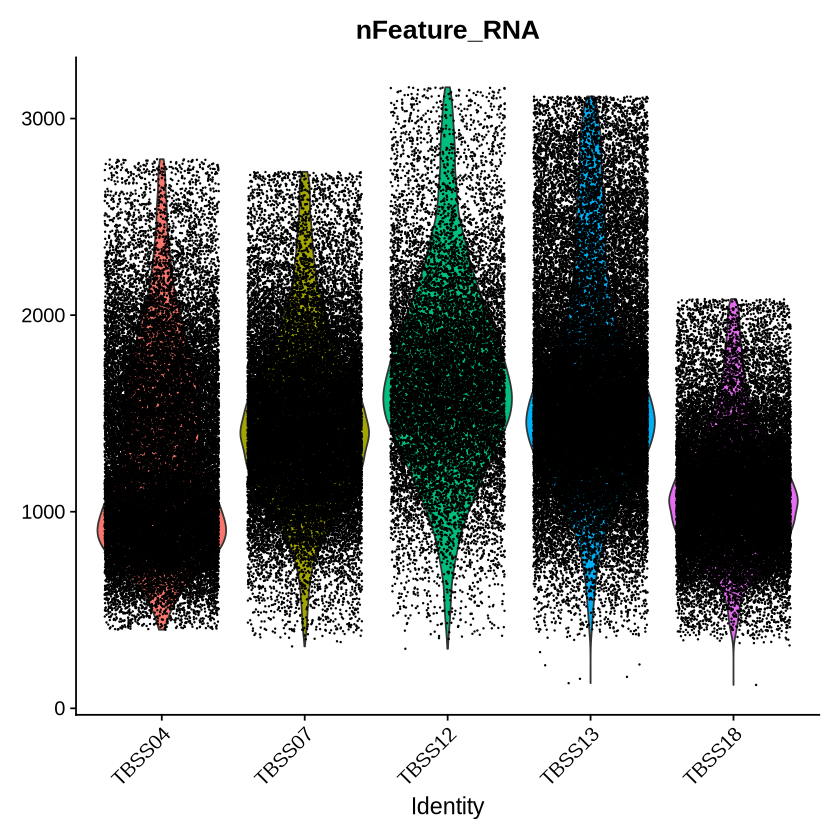

Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”


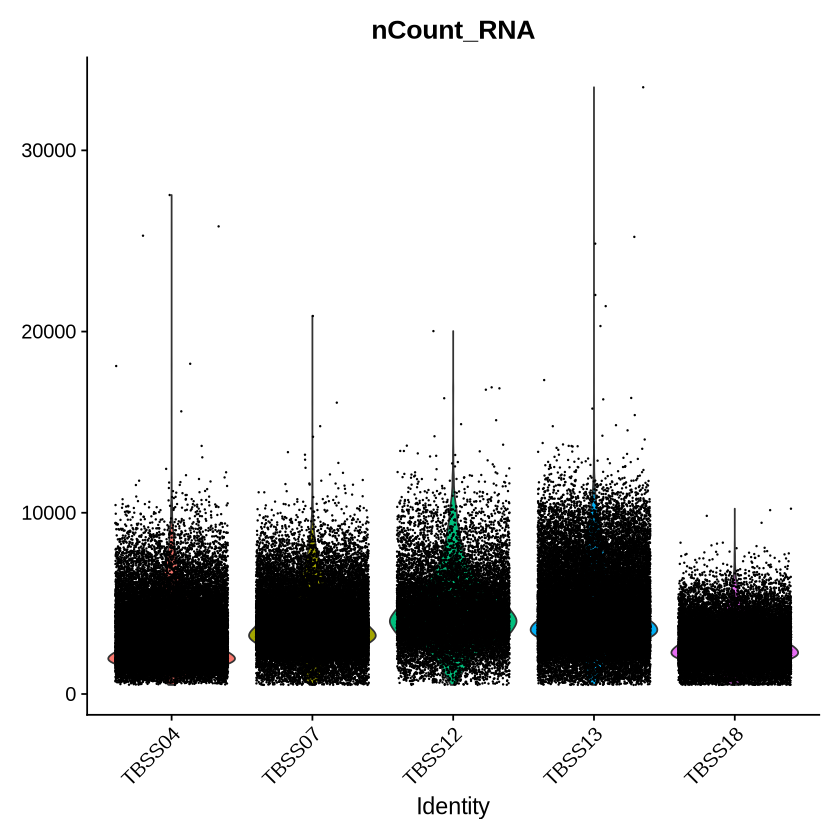

Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”


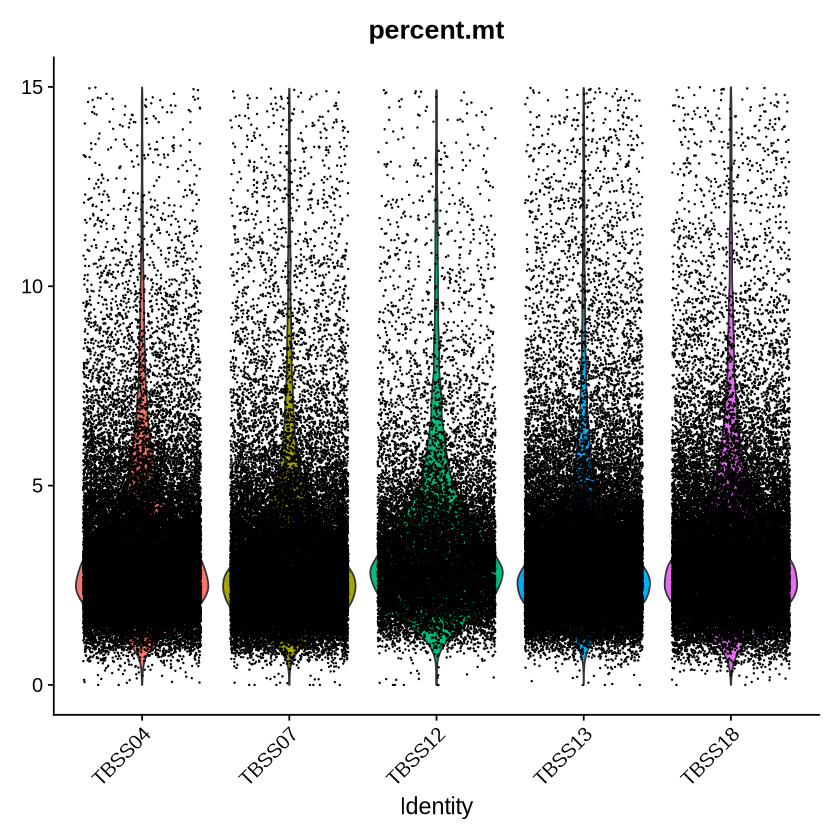

Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”


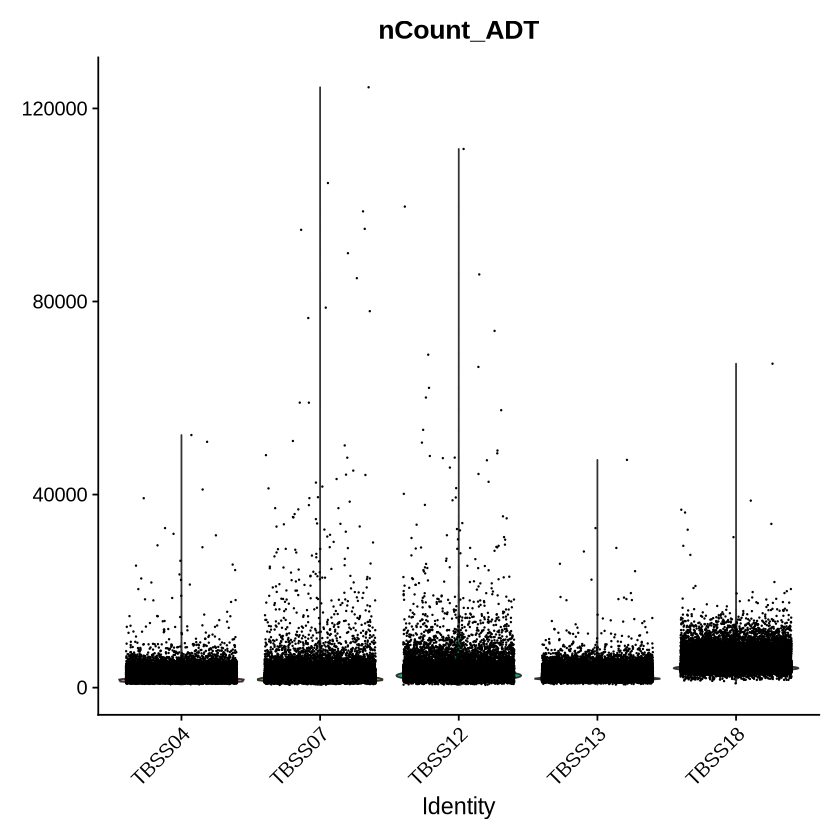

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



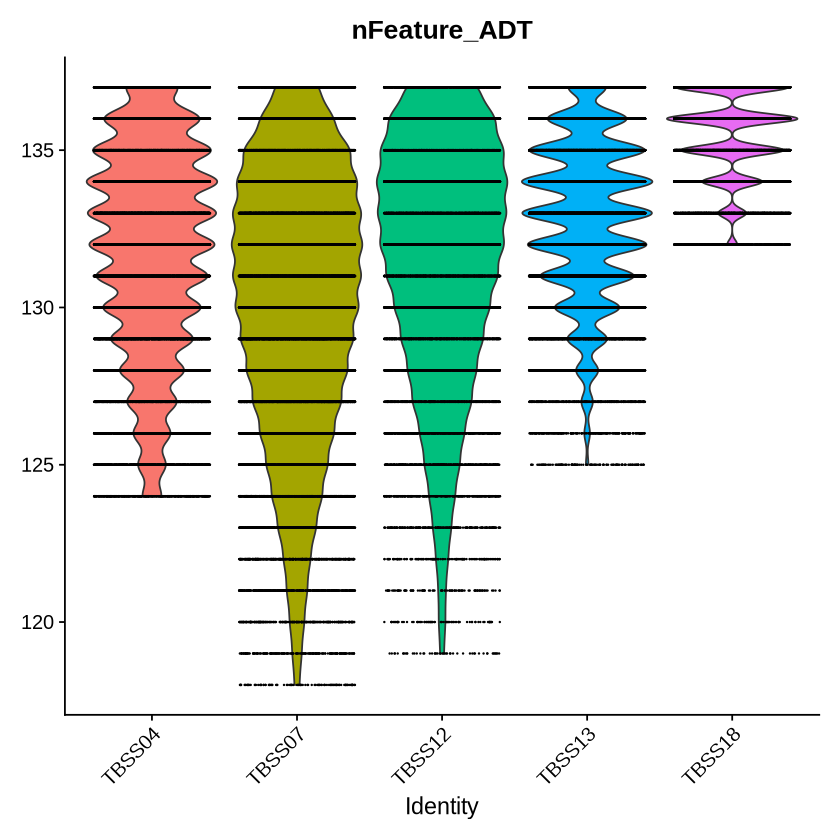

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



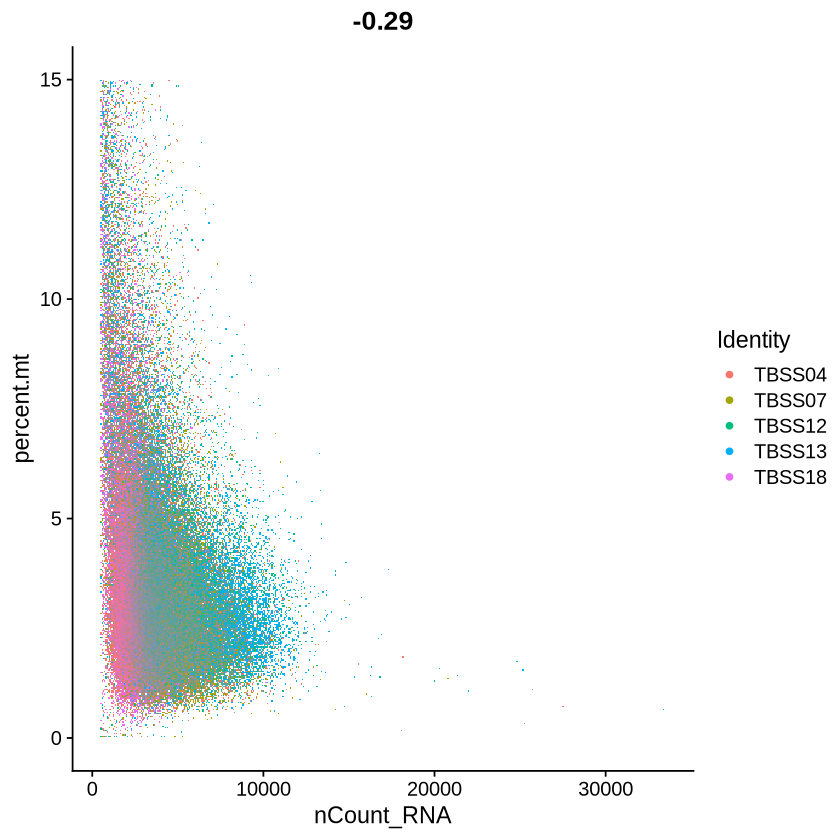

Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”


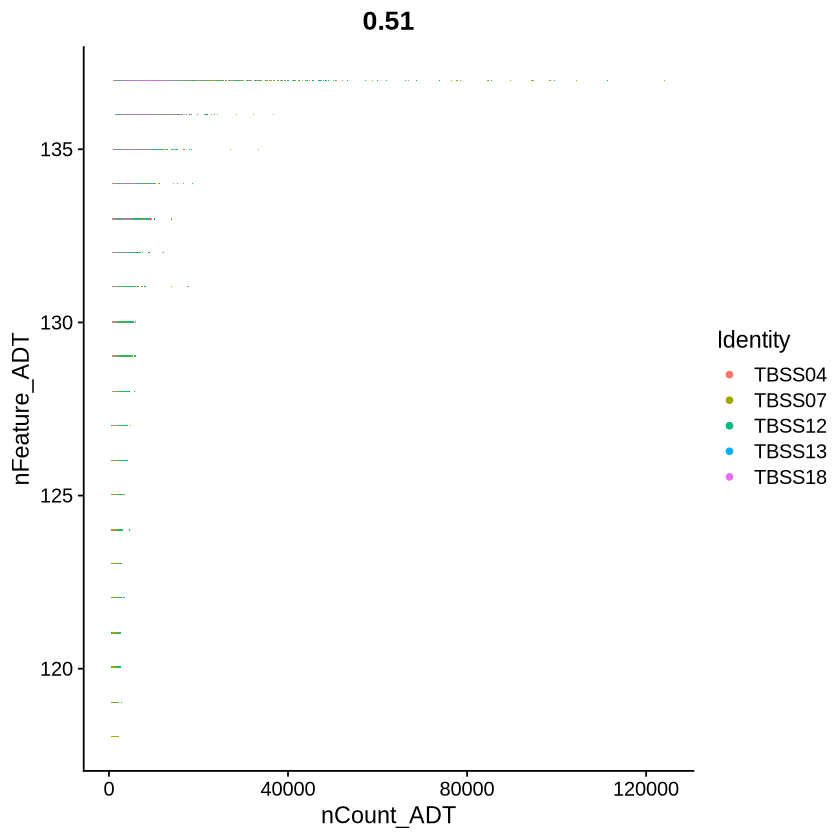

Normalizing layer: counts.TBSS04.SeuratProject.SeuratProject.SeuratProject

Normalizing layer: counts.TBSS07.SeuratProject.SeuratProject.SeuratProject

Normalizing layer: counts.TBSS12.SeuratProject.SeuratProject

Normalizing layer: counts.TBSS13.SeuratProject

Normalizing layer: counts.TBSS18

Finding variable features for layer counts.TBSS04.SeuratProject.SeuratProject.SeuratProject

Finding variable features for layer counts.TBSS07.SeuratProject.SeuratProject.SeuratProject

Finding variable features for layer counts.TBSS12.SeuratProject.SeuratProject

Finding variable features for layer counts.TBSS13.SeuratProject

Finding variable features for layer counts.TBSS18

Centering and scaling data matrix

PCA_ 1 
Positive:  IFITM1, CD69, IL32, IL7R, RPLP0, CCL5, CD7, ZFP36L2, LTB, TCF7 
	   CAMK4, RPS26, CST7, NKG7, KLF2, GNLY, LEF1, CTSW, PDE3B, TSC22D3 
	   PRKCQ-AS1, GZMH, KLRK1, MAL, BACH2, GZMA, FGFBP2, TRBC1, NOSIP, RCAN3 
Negative:  FCN1, IFI30, SPI1, CST3, VCAN, SERPINA1, LYZ, CST

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 146404
Number of edges: 3974344

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8621
Number of communities: 41
Elapsed time: 110 seconds


7 singletons identified. 34 final clusters.

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
14:30:36 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

14:30:36 Read 146404 rows and found 50 numeric columns

14:30:36 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

14:30:36 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

[1] "processed combined RNA data"


Normalizing across cells

Centering and scaling data matrix

APCA_ 1 
Positive:  Hu.CD279, Hu.CD124, Hu.CD137, Hu.CD223, Hu.CD112, Hu.CD169, Hu.CD154, Hu.CD152, Hu.HLA.E, Hu.CD319 
	   Hu.CD85j, Hu.CD134, Isotype-MOPC.21, Hu.CD161, Hu.Ig.LightChain.k, Hu.CD274, Hu.CD122, Hu.CD24, Hu.CD303, Hu.CD23 
	   Hu.CD83, Hu.CD71, Hu.FceRIa, Hu.CD141, Hu.CD88, Hu.CD272, Isotype-HTK888, Isotype-RTK4530, Hu.CD146, Hu.LOX.1 
Negative:  Hu.CD45-HI30, Hu.CD48, Hu.CD11a, Hu.CD47, HuMs.CD44, Hu.CD99, Hu.CD18, Hu.CD2, Hu.CD29, Hu.CD352 
	   Hu.HLA.ABC, Hu.CD52, Hu.CD31, Hu.CD5, Hu.CD57, Hu.CD45RA, Hu.CD3-UCHT1, Hu.CD49d, HuMs.CD49f, Hu.CD7 
	   Hu.IgM, Hu.CD41, Hu.CD8, Hu.CD62P, Hu.CD27, Hu.CD36, Hu.TCR.AB, Hu.CD11c, Hu.CD4-RPA.T4, Hu.CD81 
APCA_ 2 
Positive:  Hu.CLEC12A, Hu.CD33, Hu.CD36, Hu.CD11c, Hu.CD35, Hu.CD41, Hu.CD62P, Hu.CD64, Hu.CD31, Hu.CD49b 
	   Hu.CD328, Hu.CD32, Hu.CD11b, Hu.HLA.DR, Hu.CD54, Hu.CD39, Hu.CD86, Hu.CD107a, Hu.CD58, Hu.CD29 
	   Hu.CD42b, Hu.CD13, Hu.CD38-HIT2, Hu.CD226-11A8, 

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 146404
Number of edges: 3974344

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8621
Number of communities: 41
Elapsed time: 107 seconds


7 singletons identified. 34 final clusters.

14:43:11 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

14:43:11 Read 146404 rows and found 50 numeric columns

14:43:11 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

14:43:11 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:43:47 Writing NN index file to temp file /tmp/Rtmp6oSRHA/file25445efb7e26

14:43:47 Searching Annoy index using 1 thread, search_k = 3000

14:45:40 Annoy recall = 100%

14:45:42 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

14:4

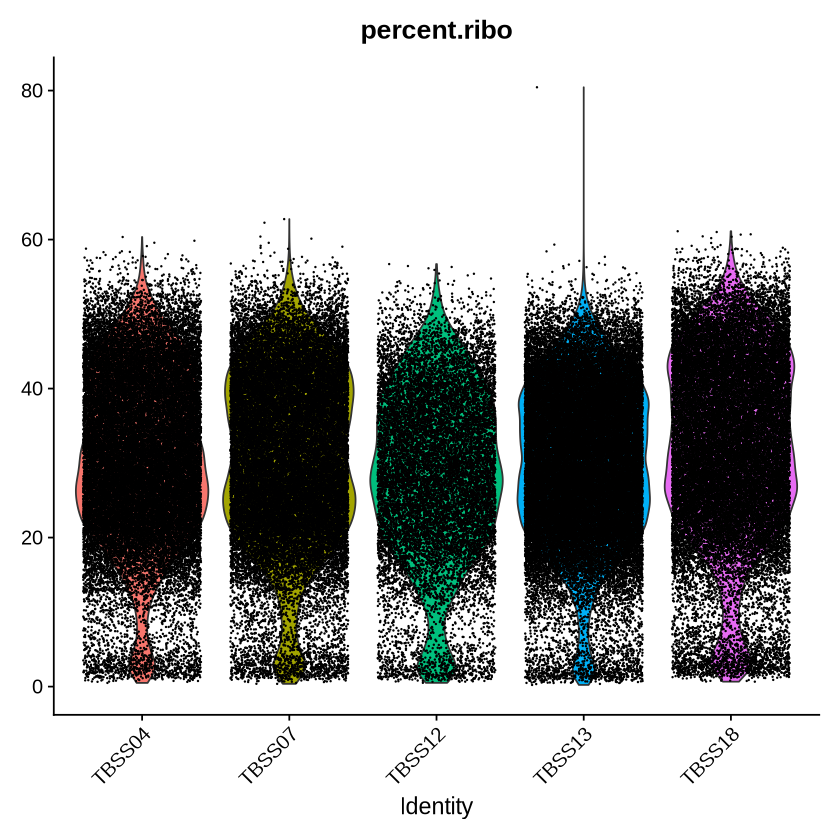

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Warning message:
“ggrepel: 3 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


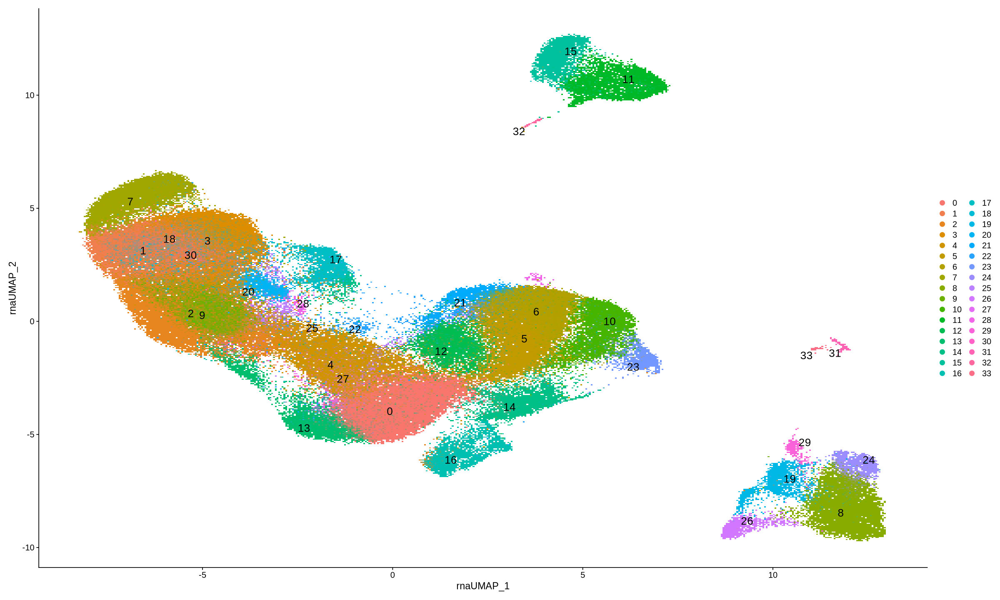

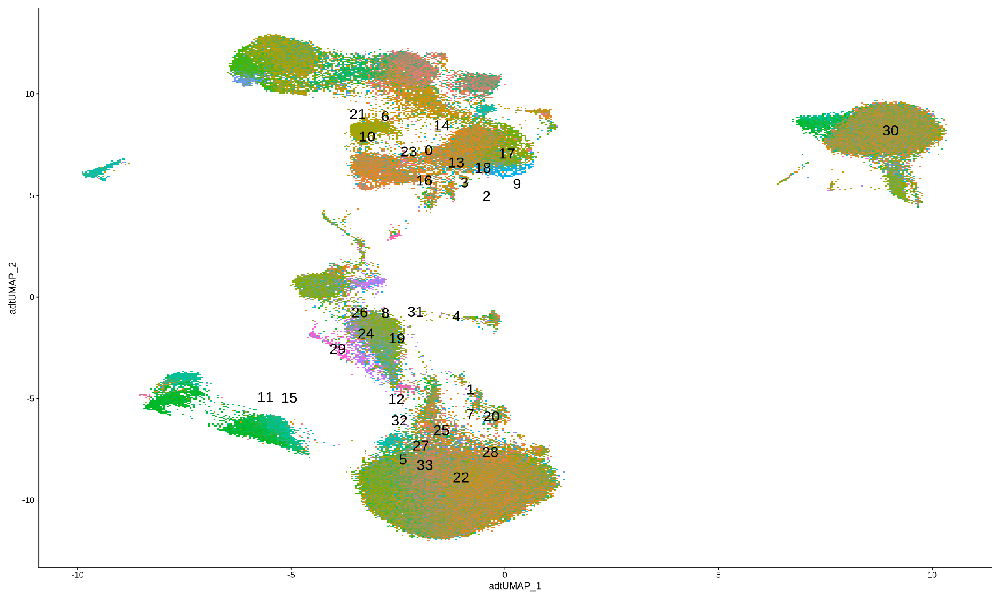

In [5]:

library(Seurat)
#library(tidyverse)
library(ggplot2)
library(scales)
library(dplyr)
#library(DoubletFinder)
library(glmGamPoi)
library(openxlsx)
library(HGNChelper)
set.seed(411)
print("m")
options(future.globals.maxSize = 3 * 1024^3) 

#MULTIMODAL NEIGHBORS STEP TKAES TOO LOMG NEXT TIE RUN IN A SCREEN

library("harmony")

paths <- c(
    "/share/hennlab/projects/NCR_scRNAseq/scripts/seurat/testbox/TBSS04_basic_seurat.rds",
    "/share/hennlab/projects/NCR_scRNAseq/scripts/seurat/testbox/TBSS07_basic_seurat.rds",
    "/share/hennlab/projects/NCR_scRNAseq/scripts/seurat/testbox/TBSS12_basic_seurat.rds",
    "/share/hennlab/projects/NCR_scRNAseq/scripts/seurat/testbox/TBSS13_basic_seurat.rds",
    "/share/hennlab/projects/NCR_scRNAseq/scripts/seurat/testbox/TBSS18_basic_seurat.rds")

# Load Seurat objects
seurat_list <- lapply(paths, readRDS)
#(files are reead

# pipeline is to create merged object using Harmony begons here
#Merge Seurat objects
combined <- Reduce(function(x, y) merge(x, y), seurat_list)
head(combined@meta.data)

ncol(combined)



VlnPlot(combined, features = c("nFeature_RNA"), group.by = "orig.ident") + guides(fill = "none") 
# basc qc
#violin plot
VlnPlot(combined, features = c("nCount_RNA"), group.by = "orig.ident") + guides(fill = "none")  

#violin plot
VlnPlot(combined, features = c("percent.mt"), group.by = "orig.ident") + guides(fill = "none")

VlnPlot(combined, features = c("nCount_ADT"), group.by = "orig.ident") + guides(fill = "none")  

VlnPlot(combined, features = c("nFeature_ADT"), group.by = "orig.ident") + guides(fill = "none")  

FeatureScatter(combined, feature1 = "nCount_RNA", feature2 = "percent.mt")  
 

FeatureScatter(combined, feature1 = "nCount_ADT", feature2 = "nFeature_ADT") 
 

VlnPlot(combined, features = c("percent.ribo"), group.by = "orig.ident") + guides(fill = "none") 
 

# Process RNA data with standard workflow
combined <- NormalizeData(combined, assay = "RNA", normalization.method = "LogNormalize") %>%
  FindVariableFeatures(assay = "RNA", selection.method = "vst", nfeatures = 2000) %>%    # Specify RNA assay for variable feature selection
  ScaleData(assay = "RNA") %>%               # Specify RNA assay for scaling
  RunPCA(assay = "RNA",reduction.name = "pca", reduction.key = "PCA_") %>% # Specify RNA assay for PCA
  FindNeighbors(assay = "RNA", dims = 1:50)  %>%
  FindClusters(assay = "RNA",  resolution = 1.2)  %>%
  RunUMAP(reduction = 'pca', dims = 1:50, assay = 'RNA', 
              reduction.name = 'rna.umap', reduction.key = 'rnaUMAP_')
print("processed combined RNA data")


# Process ADT data
combined <- NormalizeData(combined, assay = "ADT", normalization.method = "CLR",margin = 2) %>%
  ScaleData(assay = "ADT")

# Run PCA on all ADT features
adt_features <- rownames(combined[["ADT"]])  # Get all ADT features
combined <- RunPCA(combined, assay = "ADT", features = adt_features, reduction.name = "apca", reduction.key = "APCA_") %>%
  FindNeighbors(assay = "ADT", dims = 1:50) %>%
  FindClusters(assay = "ADT", resolution = 1.2) %>%
  RunUMAP(reduction = 'apca', dims = 1:50, assay = 'ADT', 
          reduction.name = 'adt.umap', reduction.key = 'adtUMAP_')

options(repr.plot.width = 20, repr.plot.height = 12)

DimPlot(combined, reduction = 'rna.umap',   label = TRUE, repel = TRUE, label.size = 5.5) 
  
 
DimPlot(combined, reduction = 'adt.umap',  label = TRUE, repel = TRUE, label.size = 7.5) + NoLegend()

In [6]:
source("https://raw.githubusercontent.com/IanevskiAleksandr/sc-type/master/R/gene_sets_prepare.R")
# load cell type annotation function
source("https://raw.githubusercontent.com/IanevskiAleksandr/sc-type/master/R/sctype_score_.R")
gs.list <- gene_sets_prepare("https://raw.githubusercontent.com/IanevskiAleksandr/sc-type/master/ScTypeDB_short.xlsx", "Immune system") # e.g. Imm
es.max <- sctype_score(GetAssayData(combined, assay = "RNA", layer = "scale"),
                       scaled = TRUE,
                       gs = gs.list$gs_positive,
                       gs2 = gs.list$gs_negative)

Warning message in checkGeneSymbols(markers_all):
“Human gene symbols should be all upper-case except for the 'orf' in open reading frames. The case of some letters was corrected.”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in

In [ ]:
# merge by cluster
cL_resutls <- do.call("rbind", lapply(unique(combined@meta.data$seurat_clusters), function(cl){
    es.max.cl = sort(rowSums(es.max[ ,rownames(combined@meta.data[combined@meta.data$seurat_clusters==cl, ])]), decreasing = !0)
    head(data.frame(cluster = cl, type = names(es.max.cl), scores = es.max.cl, ncells = sum(combined@meta.data$seurat_clusters==cl)), 10)
}))
sctype_scores <- cL_resutls %>% group_by(cluster) %>% top_n(n = 1, wt = scores)  

sctype_scores <- sctype_scores %>%
  mutate(type = if_else(as.numeric(as.character(scores)) < ncells / 4, "Unknown", type))
print(sctype_scores[,1:3])

combined@meta.data$sctype_classification = ""
for(j in unique(sctype_scores$cluster)){
  cl_type = sctype_scores[sctype_scores$cluster==j,]; 
  combined@meta.data$sctype_classification[combined@meta.data$seurat_clusters == j] = as.character(cl_type$type[1])
}

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



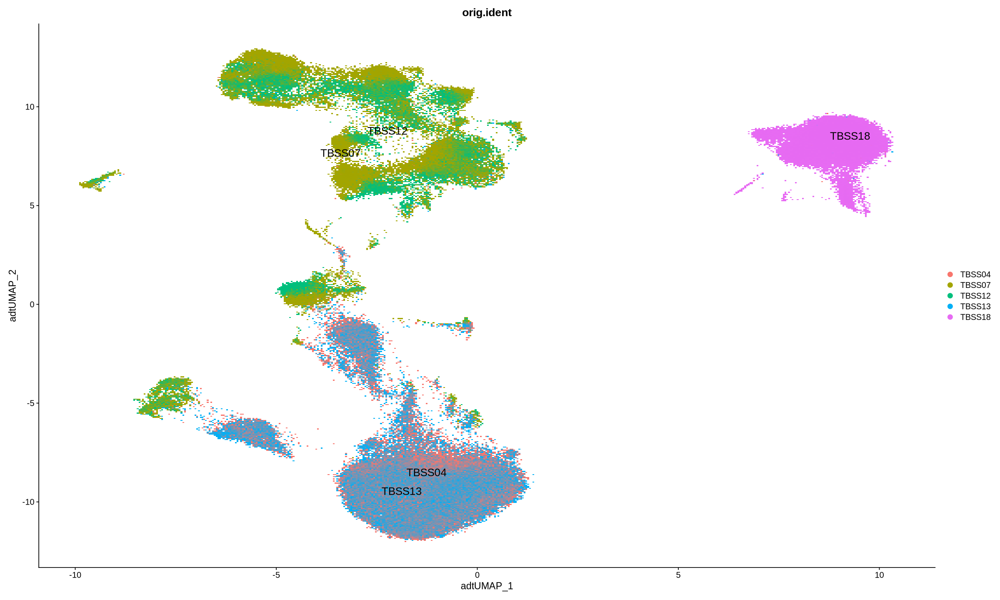

In [19]:
DimPlot(combined, reduction = 'adt.umap',  group.by = 'orig.ident' , label = TRUE, repel = TRUE, label.size = 5.5) 

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'γδ-T cells' in 'mbcsToSbcs': dot substituted for <ce>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'γδ-T cells' in 'mbcsToSbcs': dot substituted for <b3>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'γδ-T cells' in 'mbcsToSbcs': dot substituted for <ce>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'γδ-T cells' in 'mbcsToSbcs': dot substituted for <b4>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'γδ-T cells' in 'mbcsToSbcs': dot substituted for <ce>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversi

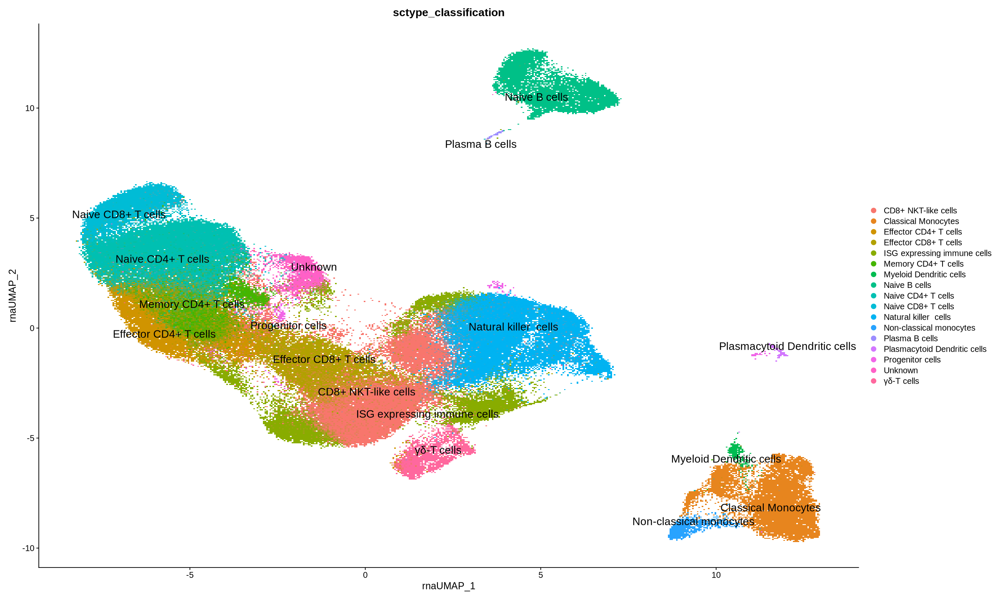

In [11]:
DimPlot(combined, reduction = 'rna.umap',  group.by = 'sctype_classification' , label = TRUE, repel = TRUE, label.size = 5.5) 

In [20]:
saveRDS(combined, file = "/share/hennlab/projects/NCR_scRNAseq/results/seurat/combined_nointegration_uniimodal.rds")

In [13]:
# Extract the metadata
metadata <- combined@meta.data

# Count the number of cells for each cell type in the 'sctype_classification' column
cell_type_counts <- metadata %>%
  group_by(sctype_classification) %>%
  summarise(cell_count = n()) %>%
  arrange(desc(cell_count))

# Display the table
print(cell_type_counts)


# A tibble: 17 × 2
   sctype_classification        cell_count
   <chr>                             <int>
 1 Naive CD4+ T cells                24761
 2 Natural killer  cells             23747
 3 CD8+ NKT-like cells               23086
 4 Effector CD4+ T cells             11263
 5 Classical Monocytes               10701
 6 ISG expressing immune cells       10506
 7 Effector CD8+ T cells              9819
 8 Naive B cells                      8412
 9 Memory CD4+ T cells                8087
10 Naive CD8+ T cells                 7616
11 γδ-T cells                         3084
12 Unknown                            2802
13 Non-classical monocytes            1209
14 Progenitor cells                    560
15 Myeloid Dendritic cells             425
16 Plasmacytoid Dendritic cells        220
17 Plasma B cells                      106


In [ ]:
# Create a new column in metadata to define the color groups
combined$custom_color <- ifelse(combined$sctype_classification == "unknown", "red", "gray")

# Generate the DimPlot with the custom colors
DimPlot(
  combined, 
  reduction = 'rna.umap',  
  group.by = 'sctype_classification', 
  cols = combined$custom_color,  # Use custom colors
  label = TRUE, 
  repel = TRUE, 
  label.size = 5.5
) + labs(title = "UMAP with Unknown Cells Highlighted")


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Warning message:
“No shared levels found between `names(values)` of the manual scale and the
data's colour values.”
Warning message:
“No shared levels found between `names(values)` of the manual scale and the
data's colour values.”
Warning message:
“No shared levels found between `names(values)` of the manual scale and the
data's colour values.”
Warning message:
“No shared levels found between `names(values)` of the manual scale and the
data's colour values.”


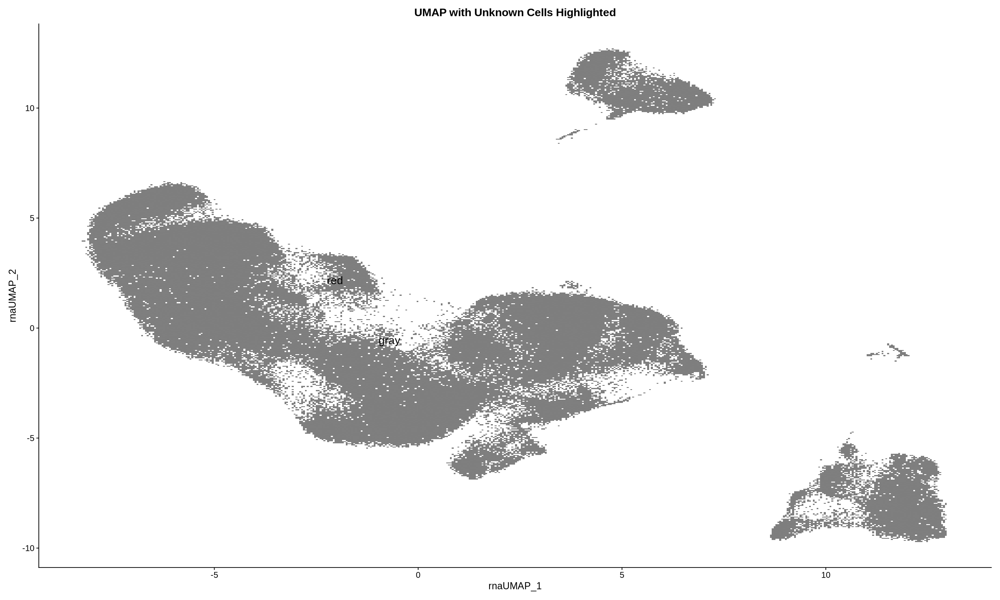

In [17]:
# Create a new column in metadata to define the color groups
combined$custom_color <- ifelse(combined$sctype_classification == "Unknown", "red", "gray")

# Generate the DimPlot with the custom colors
DimPlot(
  combined, 
  reduction = 'rna.umap',  
  group.by = 'sctype_classification', 
  cols = combined$custom_color,  # Use custom colors
  label = TRUE, 
  repel = TRUE, 
  label.size = 5.5
) + labs(title = "UMAP with Unknown Cells Highlighted")
